In [1]:
import xarray as xr
import matplotlib.pyplot as plt
from tqdm import tqdm

# Level 1(surface) _ SM

In [2]:
!ls -la /home/behzad/sm-result/*.nc

-rw-rw-r-- 1 behzad behzad 161081636 Oct 23 12:36 /home/behzad/sm-result/uerra_harmonie_soil_moisture_L1_clipped_2014.nc
-rw-rw-r-- 1 behzad behzad 161081636 Oct 23 12:36 /home/behzad/sm-result/uerra_harmonie_soil_moisture_L1_clipped_2015.nc
-rw-rw-r-- 1 behzad behzad 161522948 Oct 23 12:37 /home/behzad/sm-result/uerra_harmonie_soil_moisture_L1_clipped_2016.nc
-rw-rw-r-- 1 behzad behzad 161081636 Oct 23 12:37 /home/behzad/sm-result/uerra_harmonie_soil_moisture_L1_clipped_2017.nc
-rw-rw-r-- 1 behzad behzad 161081636 Oct 23 12:38 /home/behzad/sm-result/uerra_harmonie_soil_moisture_L1_clipped_2018.nc
-rw-rw-r-- 1 behzad behzad  66640868 Oct 23 12:38 /home/behzad/sm-result/uerra_harmonie_soil_moisture_L1_clipped_2019.nc
-rw-rw-r-- 1 behzad behzad 161081636 Oct 23 12:40 /home/behzad/sm-result/uerra_harmonie_soil_moisture_L2_clipped_2014.nc
-rw-rw-r-- 1 behzad behzad 161081636 Oct 23 12:40 /home/behzad/sm-result/uerra_harmonie_soil_moisture_L2_clipped_2015.nc
-rw-rw-r-- 1 behzad behzad 16152

## Multi-year monthly mean (Level 1)

In [3]:
!cdo -b 32 -chname,vsw,uerra_harmonie_nordics_sm_L1_ymonmean -ymonmean -cat '/home/behzad/sm-result/uerra_harmonie_soil_moisture_L1_clipped_????.nc' /home/behzad/sm-result/uerra_harmonie_soil_moisture_L1_ymonmean.nc

cdo chname: Started child process "ymonmean -cat /home/behzad/sm-result/uerra_harmonie_soil_moisture_L1_clipped_????.nc (pipe1.1)".
cdo(2) ymonmean: Started child process "cat /home/behzad/sm-result/uerra_harmonie_soil_moisture_L1_clipped_????.nc (pipe2.1)".
cdo(3) cat:                        1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 5 5 5 5 5 5 5 5 5 5 6 6 6 6 6 6 6 6 6 6 7 7 7 7 7 7 7 7 7 7 8 8 8 8 8 8 8 8 8 8 9 9 9 9 9 9 9 9 9 910cdo(3) cat: Processed 218102640 values from 6 variables over 7908 timesteps [4.32s]
cdo(2) ymonmean: Processed 218102640 values from 1 variable over 7908 timesteps [4.32s]
cdo chname: Processed 330960 values from 1 variable over 12 timesteps [4.32s 51MB]


In [4]:
ds_1 = xr.open_dataset('/home/behzad/sm-result/uerra_harmonie_soil_moisture_L1_ymonmean.nc')

In [5]:
ds_1

<xarray.Dataset>
Dimensions:                                (bnds: 2, lat: 197, lev: 1, lon: 140, time: 12)
Coordinates:
  * time                                   (time) datetime64[ns] 2019-01-31T21:00:00 ... 2018-12-31T21:00:00
  * lon                                    (lon) float32 4.5 ... 34.825535
  * lat                                    (lat) float32 53.5 ... 72.91317
  * lev                                    (lev) float64 0.5
Dimensions without coordinates: bnds
Data variables:
    lev_bnds                               (lev, bnds) float64 ...
    uerra_harmonie_nordics_sm_L1_ymonmean  (time, lev, lat, lon) float32 ...
Attributes:
    CDI:          Climate Data Interface version ?? (http://mpimet.mpg.de/cdi)
    Conventions:  CF-1.6
    history:      Wed Oct 23 12:46:39 2019: cdo -b 32 -chname,vsw,uerra_harmo...
    CDO:          Climate Data Operators version 1.9.3 (http://mpimet.mpg.de/...

100%|██████████| 4/4 [00:00<00:00, 12.59it/s]


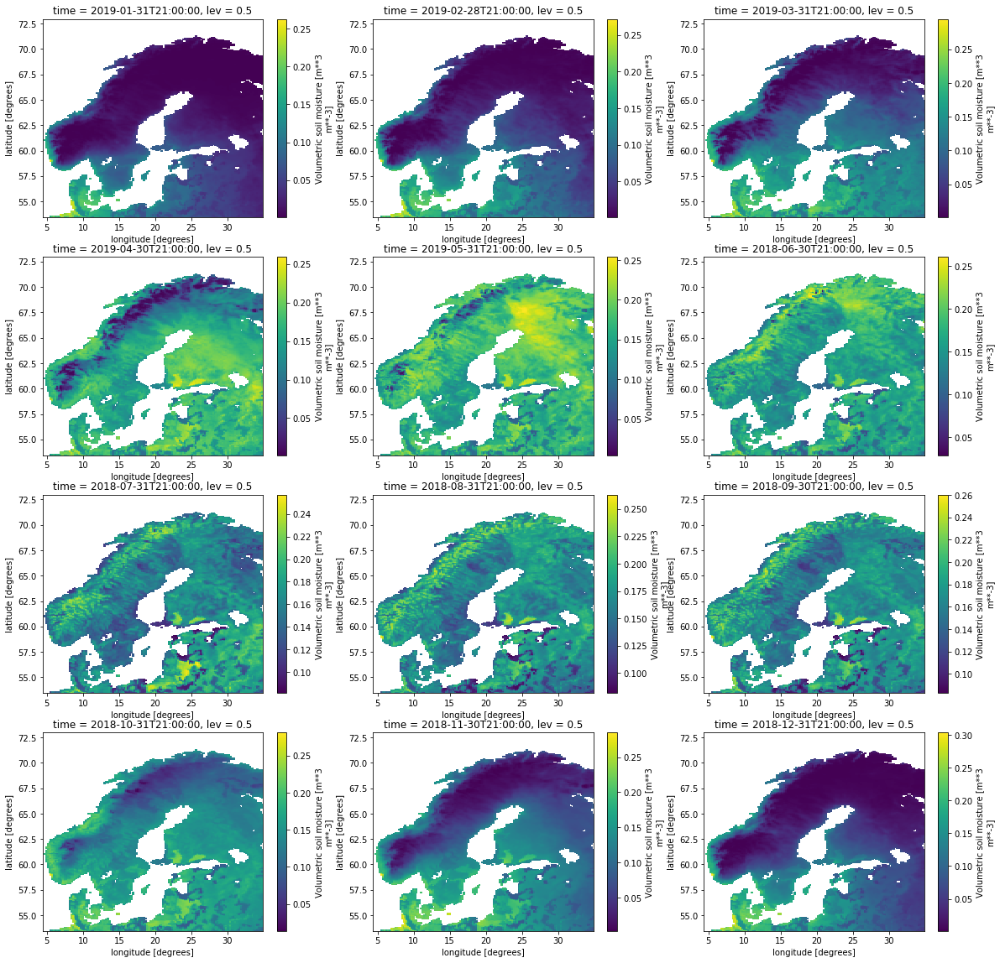

In [6]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20,20))
for i in tqdm(range(0, 4)):
    for j in range(0, 3):
        year = ((i * 3) + j)
        ds_1.uerra_harmonie_nordics_sm_L1_ymonmean.isel(time=year,lev=0).plot.pcolormesh(ax=axes[i,j])

## Multi-year monthly max (Level 1)

In [7]:
!cdo -b 32 -chname,vsw,uerra_harmonie_nordics_sm_L1_ymonmax -ymonmax -cat '/home/behzad/sm-result/uerra_harmonie_soil_moisture_L1_clipped_????.nc' /home/behzad/sm-result/uerra_harmonie_soil_moisture_L1_ymonmax.nc

cdo chname: Started child process "ymonmax -cat /home/behzad/sm-result/uerra_harmonie_soil_moisture_L1_clipped_????.nc (pipe1.1)".
cdo(2) ymonmax: Started child process "cat /home/behzad/sm-result/uerra_harmonie_soil_moisture_L1_clipped_????.nc (pipe2.1)".
cdo(3) cat:                        1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 5 5 5 5 5 5 5 5 5 5 6 6 6 6 6 6 6 6 6 6 7 7 7 7 7 7 7 7 7 7 8 8 8 8 8 8 8 8 8 8 9 9 9 9 9 9 9 9 9 910cdo(3) cat: Processed 218102640 values from 6 variables over 7908 timesteps [3.79s]
cdo(2) ymonmax: Processed 218102640 values from 1 variable over 7908 timesteps [3.80s]
cdo chname: Processed 330960 values from 1 variable over 12 timesteps [3.80s 51MB]


In [8]:
dsmax_1 = xr.open_dataset('/home/behzad/sm-result/uerra_harmonie_soil_moisture_L1_ymonmax.nc')

100%|██████████| 4/4 [00:00<00:00, 12.09it/s]


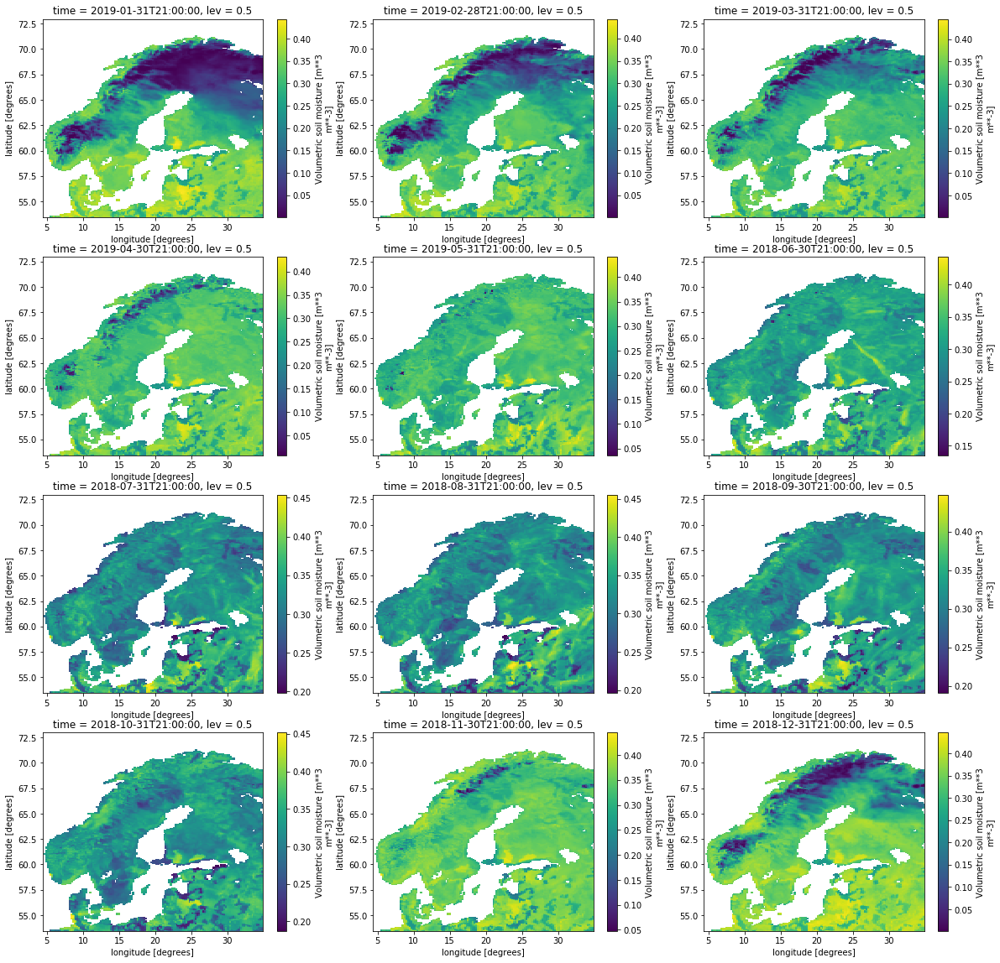

In [9]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20,20))
for i in tqdm(range(0, 4)):
    for j in range(0, 3):
        year = ((i * 3) + j)
        dsmax_1.uerra_harmonie_nordics_sm_L1_ymonmax.isel(time=year,lev=0).plot.pcolormesh(ax=axes[i,j])

## Multi-year monthly min (Level 1)

In [10]:
!cdo -b 32 -chname,vsw,uerra_harmonie_nordics_sm_L1_ymonmin -ymonmin -cat '/home/behzad/sm-result/uerra_harmonie_soil_moisture_L1_clipped_????.nc' /home/behzad/sm-result/uerra_harmonie_soil_moisture_L1_ymonmin.nc

cdo chname: Started child process "ymonmin -cat /home/behzad/sm-result/uerra_harmonie_soil_moisture_L1_clipped_????.nc (pipe1.1)".
cdo(2) ymonmin: Started child process "cat /home/behzad/sm-result/uerra_harmonie_soil_moisture_L1_clipped_????.nc (pipe2.1)".
cdo(3) cat:                        1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 5 5 5 5 5 5 5 5 5 5 6 6 6 6 6 6 6 6 6 6 7 7 7 7 7 7 7 7 7 7 8 8 8 8 8 8 8 8 8 8 9 9 9 9 9 9 9 9 9 910cdo(3) cat: Processed 218102640 values from 6 variables over 7908 timesteps [3.70s]
cdo(2) ymonmin: Processed 218102640 values from 1 variable over 7908 timesteps [3.70s]
cdo chname: Processed 330960 values from 1 variable over 12 timesteps [3.70s 51MB]


In [11]:
dsmin_1 = xr.open_dataset('/home/behzad/sm-result/uerra_harmonie_soil_moisture_L1_ymonmin.nc')

100%|██████████| 4/4 [00:00<00:00, 12.43it/s]


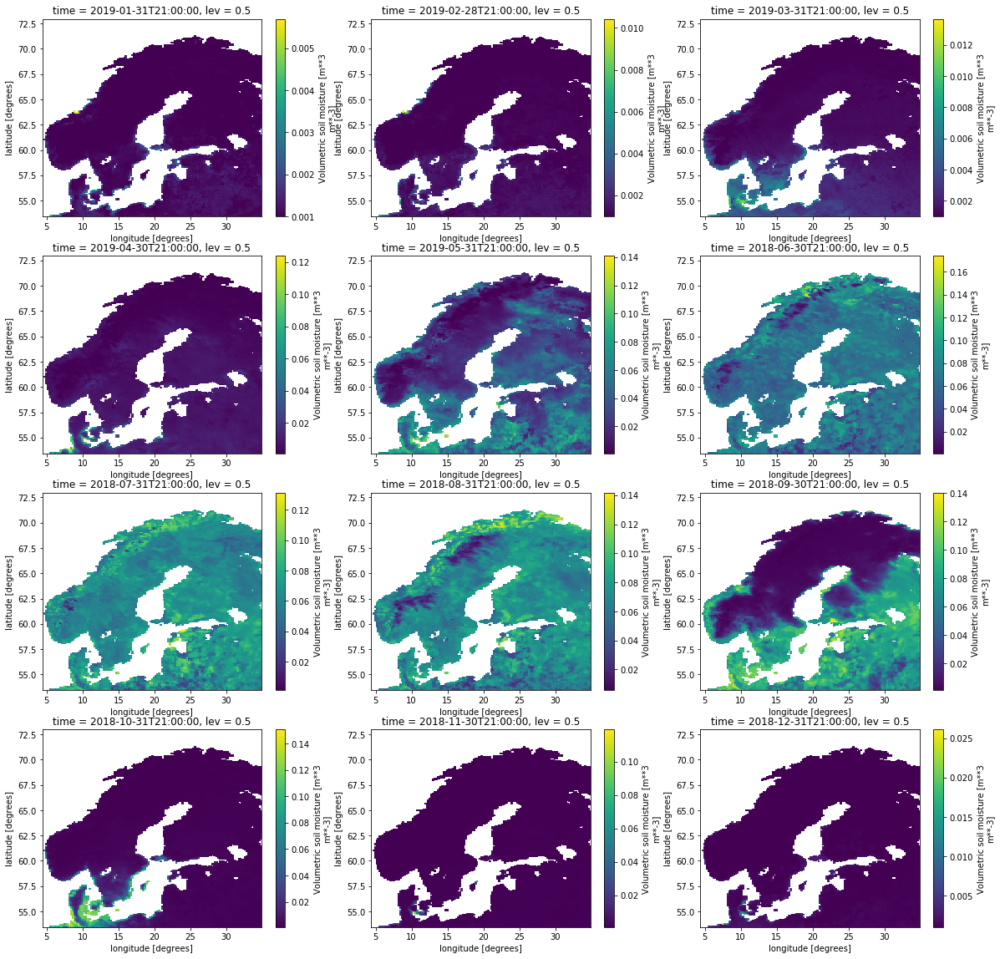

In [12]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20,20))
for i in tqdm(range(0, 4)):
    for j in range(0, 3):
        year = ((i * 3) + j)
        dsmin_1.uerra_harmonie_nordics_sm_L1_ymonmin.isel(time=year,lev=0).plot.pcolormesh(ax=axes[i,j])

## Multi-year monthly std (Level 1)

In [13]:
!cdo -b 32 -chname,vsw,uerra_harmonie_nordics_sm_L1_ymonstd -ymonstd -cat '/home/behzad/sm-result/uerra_harmonie_soil_moisture_L1_clipped_????.nc' /home/behzad/sm-result/uerra_harmonie_soil_moisture_L1_ymonstd.nc

cdo chname: Started child process "ymonstd -cat /home/behzad/sm-result/uerra_harmonie_soil_moisture_L1_clipped_????.nc (pipe1.1)".
cdo(2) ymonstd: Started child process "cat /home/behzad/sm-result/uerra_harmonie_soil_moisture_L1_clipped_????.nc (pipe2.1)".
cdo(3) cat:                        1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 5 5 5 5 5 5 5 5 5 5 6 6 6 6 6 6 6 6 6 6 7 7 7 7 7 7 7 7 7 7 8 8 8 8 8 8 8 8 8 8 9 9 9 9 9 9 9 9 9 910cdo(3) cat: Processed 218102640 values from 6 variables over 7908 timesteps [4.96s]
cdo(2) ymonstd: Processed 218102640 values from 1 variable over 7908 timesteps [4.96s]
cdo chname: Processed 330960 values from 1 variable over 12 timesteps [4.96s 55MB]


In [14]:
dsstd_1 = xr.open_dataset('/home/behzad/sm-result/uerra_harmonie_soil_moisture_L1_ymonstd.nc')

100%|██████████| 4/4 [00:00<00:00, 12.93it/s]


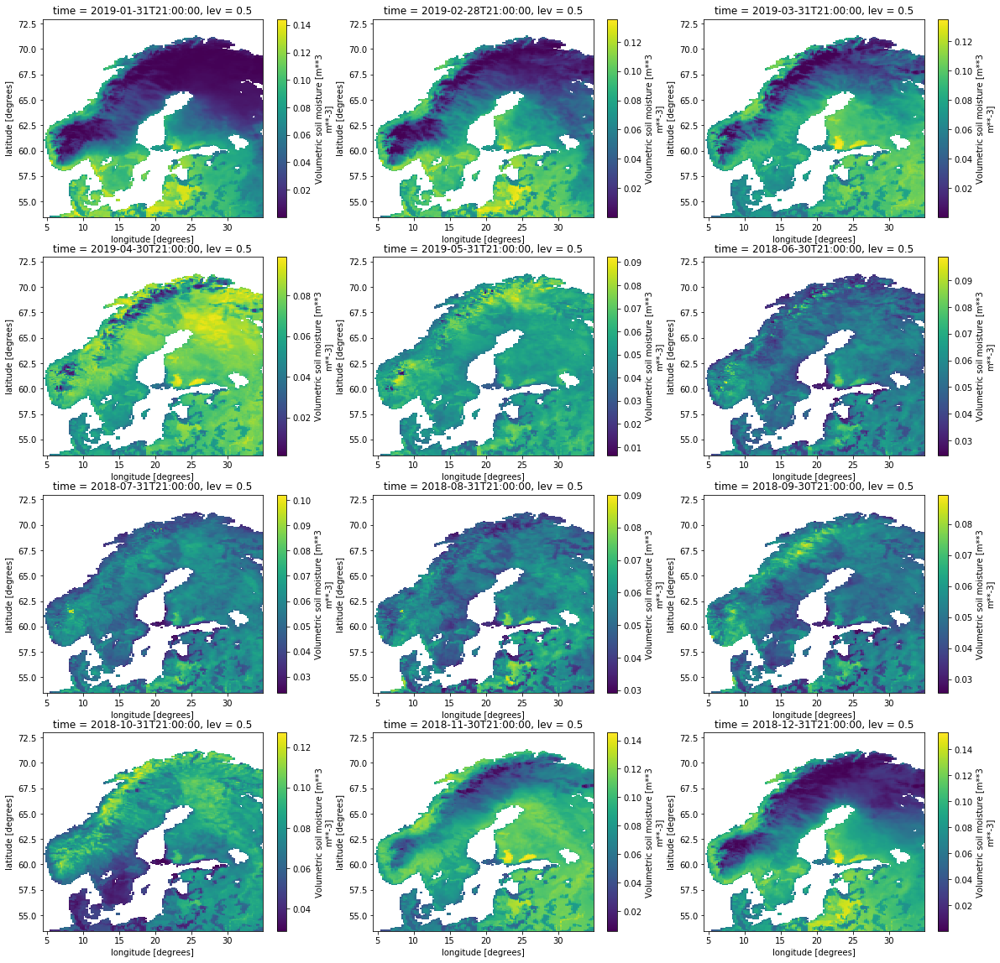

In [15]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20,20))
for i in tqdm(range(0, 4)):
    for j in range(0, 3):
        year = ((i * 3) + j)
        dsstd_1.uerra_harmonie_nordics_sm_L1_ymonstd.isel(time=year,lev=0).plot.pcolormesh(ax=axes[i,j])

# Level 2 (Root depth)_ SM

In [16]:
!ls -la /data-uerra-sm/UERRA-HARMONIE/level_2

total 4510412
drwxrwxrwx 2 root root         0 Oct 14 07:04 .
drwxrwxrwx 2 root root         0 Oct 14 06:04 ..
-rwxrwxrwx 1 root root 852711540 Oct 14 07:12 uerra_harmonie_soil_moisture_L2_2014.grib
-rwxrwxrwx 1 root root 852711540 Oct 14 07:13 uerra_harmonie_soil_moisture_L2_2015.grib
-rwxrwxrwx 1 root root 855047736 Oct 14 07:14 uerra_harmonie_soil_moisture_L2_2016.grib
-rwxrwxrwx 1 root root 852711540 Oct 14 07:15 uerra_harmonie_soil_moisture_L2_2017.grib
-rwxrwxrwx 1 root root 852711540 Oct 14 07:15 uerra_harmonie_soil_moisture_L2_2018.grib
-rwxrwxrwx 1 root root 352765596 Oct 14 07:16 uerra_harmonie_soil_moisture_L2_2019.grib


## Multi-year monthly mean (Level 2)

In [17]:
!cdo -b 32 -chname,vsw,uerra_harmonie_nordics_sm_L2_ymonmean -ymonmean -cat '/home/behzad/sm-result/uerra_harmonie_soil_moisture_L2_clipped_????.nc' /home/behzad/sm-result/uerra_harmonie_soil_moisture_L2_ymonmean.nc

cdo chname: Started child process "ymonmean -cat /home/behzad/sm-result/uerra_harmonie_soil_moisture_L2_clipped_????.nc (pipe1.1)".
cdo(2) ymonmean: Started child process "cat /home/behzad/sm-result/uerra_harmonie_soil_moisture_L2_clipped_????.nc (pipe2.1)".
cdo(3) cat:                        1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 5 5 5 5 5 5 5 5 5 5 6 6 6 6 6 6 6 6 6 6 7 7 7 7 7 7 7 7 7 7 8 8 8 8 8 8 8 8 8 8 9 9 9 9 9 9 9 9 9 910cdo(3) cat: Processed 218102640 values from 6 variables over 7908 timesteps [4.28s]
cdo(2) ymonmean: Processed 218102640 values from 1 variable over 7908 timesteps [4.28s]
cdo chname: Processed 330960 values from 1 variable over 12 timesteps [4.28s 53MB]


In [18]:
ds_2 = xr.open_dataset('/home/behzad/sm-result/uerra_harmonie_soil_moisture_L2_ymonmean.nc')

In [19]:
ds_2

<xarray.Dataset>
Dimensions:                                (bnds: 2, lat: 197, lev: 1, lon: 140, time: 12)
Coordinates:
  * time                                   (time) datetime64[ns] 2019-01-31T21:00:00 ... 2018-12-31T21:00:00
  * lon                                    (lon) float32 4.5 ... 34.825535
  * lat                                    (lat) float32 53.5 ... 72.91317
  * lev                                    (lev) float64 1.5
Dimensions without coordinates: bnds
Data variables:
    lev_bnds                               (lev, bnds) float64 ...
    uerra_harmonie_nordics_sm_L2_ymonmean  (time, lev, lat, lon) float32 ...
Attributes:
    CDI:          Climate Data Interface version ?? (http://mpimet.mpg.de/cdi)
    Conventions:  CF-1.6
    history:      Wed Oct 23 12:48:16 2019: cdo -b 32 -chname,vsw,uerra_harmo...
    CDO:          Climate Data Operators version 1.9.3 (http://mpimet.mpg.de/...

100%|██████████| 4/4 [00:00<00:00, 13.01it/s]


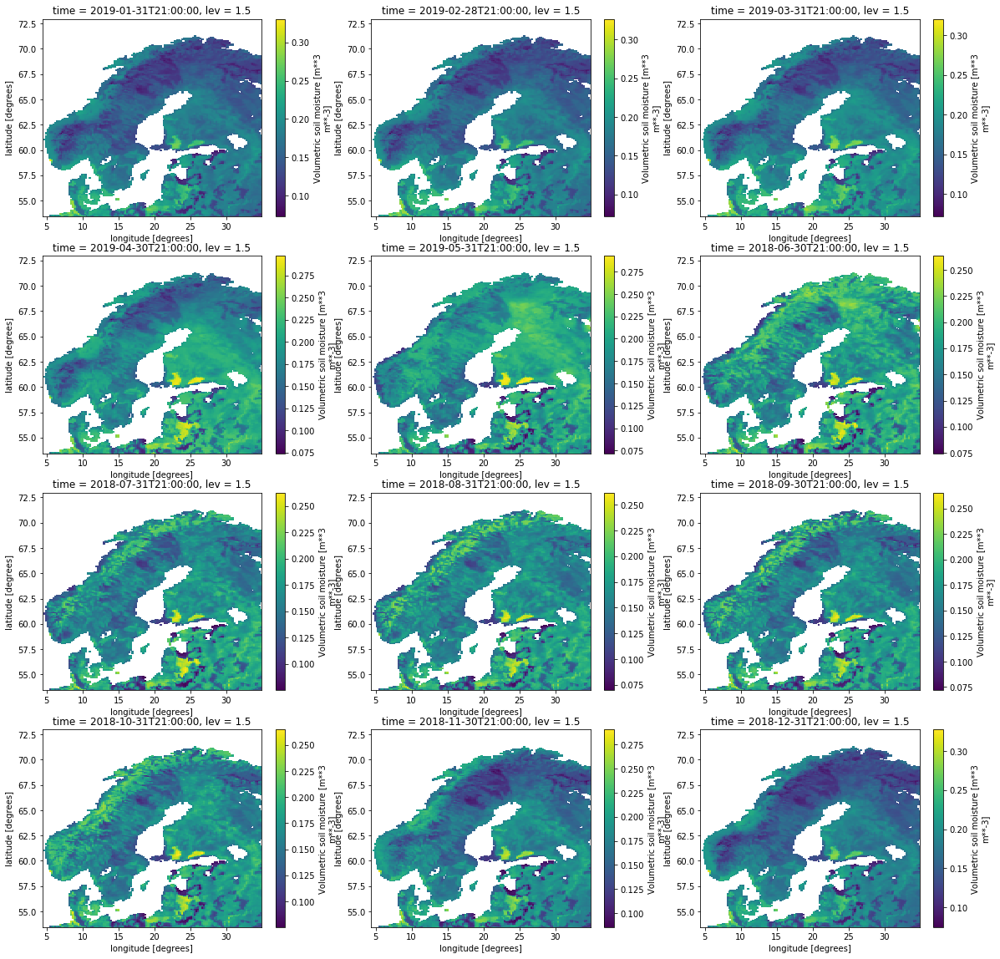

In [20]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20,20))
for i in tqdm(range(0, 4)):
    for j in range(0, 3):
        year = ((i * 3) + j)
        ds_2.uerra_harmonie_nordics_sm_L2_ymonmean.isel(time=year,lev=0).plot.pcolormesh(ax=axes[i,j])

## Multi-year monthly max (Level 2)

In [21]:
!cdo -b 32 -chname,vsw,uerra_harmonie_nordics_sm_L2_ymonmax -ymonmax -cat '/home/behzad/sm-result/uerra_harmonie_soil_moisture_L2_clipped_????.nc' /home/behzad/sm-result/uerra_harmonie_soil_moisture_L2_ymonmax.nc

cdo chname: Started child process "ymonmax -cat /home/behzad/sm-result/uerra_harmonie_soil_moisture_L2_clipped_????.nc (pipe1.1)".
cdo(2) ymonmax: Started child process "cat /home/behzad/sm-result/uerra_harmonie_soil_moisture_L2_clipped_????.nc (pipe2.1)".
cdo(3) cat:                        1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 5 5 5 5 5 5 5 5 5 5 6 6 6 6 6 6 6 6 6 6 7 7 7 7 7 7 7 7 7 7 8 8 8 8 8 8 8 8 8 8 9 9 9 9 9 9 9 9 9 910cdo(3) cat: Processed 218102640 values from 6 variables over 7908 timesteps [3.70s]
cdo(2) ymonmax: Processed 218102640 values from 1 variable over 7908 timesteps [3.70s]
cdo chname: Processed 330960 values from 1 variable over 12 timesteps [3.70s 51MB]


In [22]:
dsmax_2 = xr.open_dataset('/home/behzad/sm-result/uerra_harmonie_soil_moisture_L2_ymonmax.nc')

100%|██████████| 4/4 [00:00<00:00,  9.65it/s]


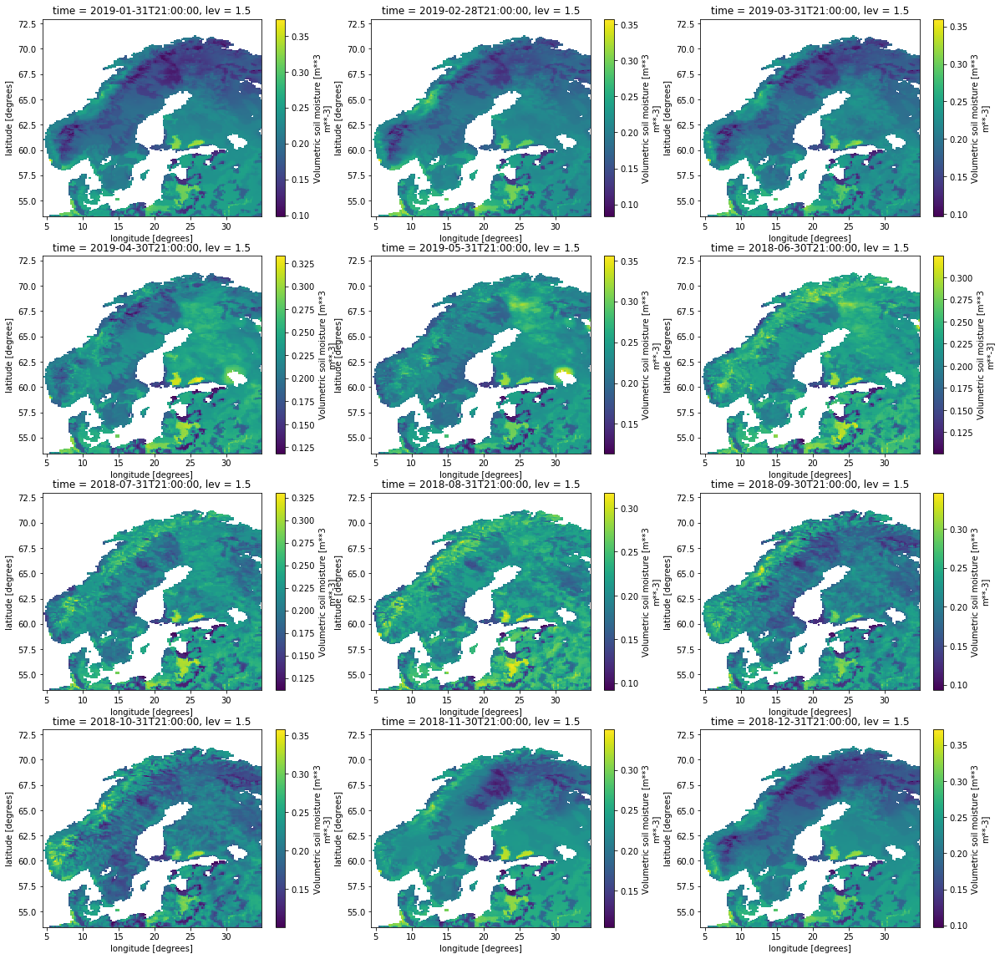

In [23]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20,20))
for i in tqdm(range(0, 4)):
    for j in range(0, 3):
        year = ((i * 3) + j)
        dsmax_2.uerra_harmonie_nordics_sm_L2_ymonmax.isel(time=year,lev=0).plot.pcolormesh(ax=axes[i,j])

## Multi-year monthly min (Level 2)

In [24]:
!cdo -b 32 -chname,vsw,uerra_harmonie_nordics_sm_L2_ymonmin -ymonmin -cat '/home/behzad/sm-result/uerra_harmonie_soil_moisture_L2_clipped_????.nc' /home/behzad/sm-result/uerra_harmonie_soil_moisture_L2_ymonmin.nc

cdo chname: Started child process "ymonmin -cat /home/behzad/sm-result/uerra_harmonie_soil_moisture_L2_clipped_????.nc (pipe1.1)".
cdo(2) ymonmin: Started child process "cat /home/behzad/sm-result/uerra_harmonie_soil_moisture_L2_clipped_????.nc (pipe2.1)".
cdo(3) cat:                        1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 5 5 5 5 5 5 5 5 5 5 6 6 6 6 6 6 6 6 6 6 7 7 7 7 7 7 7 7 7 7 8 8 8 8 8 8 8 8 8 8 9 9 9 9 9 9 9 9 9 910cdo(3) cat: Processed 218102640 values from 6 variables over 7908 timesteps [3.72s]
cdo(2) ymonmin: Processed 218102640 values from 1 variable over 7908 timesteps [3.72s]
cdo chname: Processed 330960 values from 1 variable over 12 timesteps [3.73s 51MB]


In [25]:
dsmin_2 = xr.open_dataset('/home/behzad/sm-result/uerra_harmonie_soil_moisture_L2_ymonmin.nc')

100%|██████████| 4/4 [00:00<00:00, 12.32it/s]


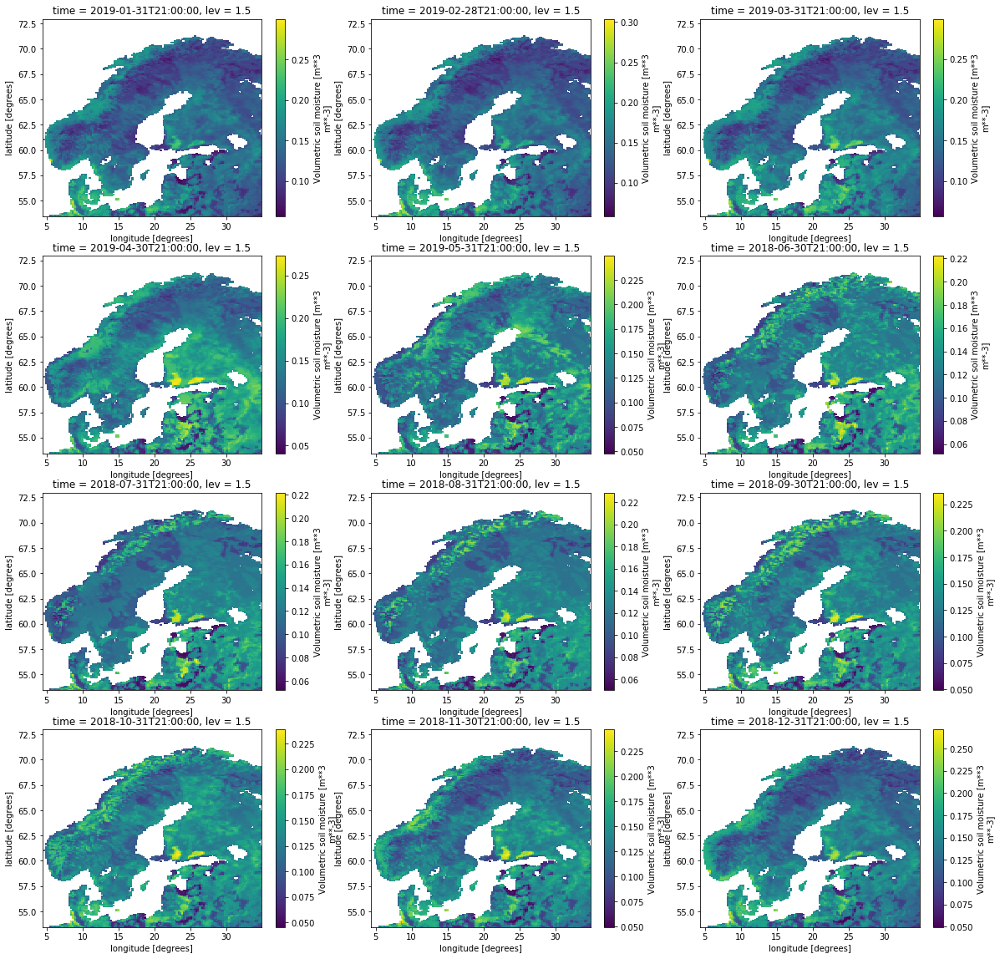

In [26]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20,20))
for i in tqdm(range(0, 4)):
    for j in range(0, 3):
        year = ((i * 3) + j)
        dsmin_2.uerra_harmonie_nordics_sm_L2_ymonmin.isel(time=year,lev=0).plot.pcolormesh(ax=axes[i,j])

## Multi-year monthly std (Level 2)

In [27]:
!cdo -b 32 -chname,vsw,uerra_harmonie_nordics_sm_L2_ymonstd -ymonstd -cat '/home/behzad/sm-result/uerra_harmonie_soil_moisture_L2_clipped_????.nc' /home/behzad/sm-result/uerra_harmonie_soil_moisture_L2_ymonstd.nc

cdo chname: Started child process "ymonstd -cat /home/behzad/sm-result/uerra_harmonie_soil_moisture_L2_clipped_????.nc (pipe1.1)".
cdo(2) ymonstd: Started child process "cat /home/behzad/sm-result/uerra_harmonie_soil_moisture_L2_clipped_????.nc (pipe2.1)".
cdo(3) cat:                        1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 5 5 5 5 5 5 5 5 5 5 6 6 6 6 6 6 6 6 6 6 7 7 7 7 7 7 7 7 7 7 8 8 8 8 8 8 8 8 8 8 9 9 9 9 9 9 9 9 9 910cdo(3) cat: Processed 218102640 values from 6 variables over 7908 timesteps [4.93s]
cdo(2) ymonstd: Processed 218102640 values from 1 variable over 7908 timesteps [4.93s]
cdo chname: Processed 330960 values from 1 variable over 12 timesteps [4.93s 53MB]


In [28]:
dsstd_2 = xr.open_dataset('/home/behzad/sm-result/uerra_harmonie_soil_moisture_L2_ymonstd.nc')

100%|██████████| 4/4 [00:00<00:00, 12.77it/s]


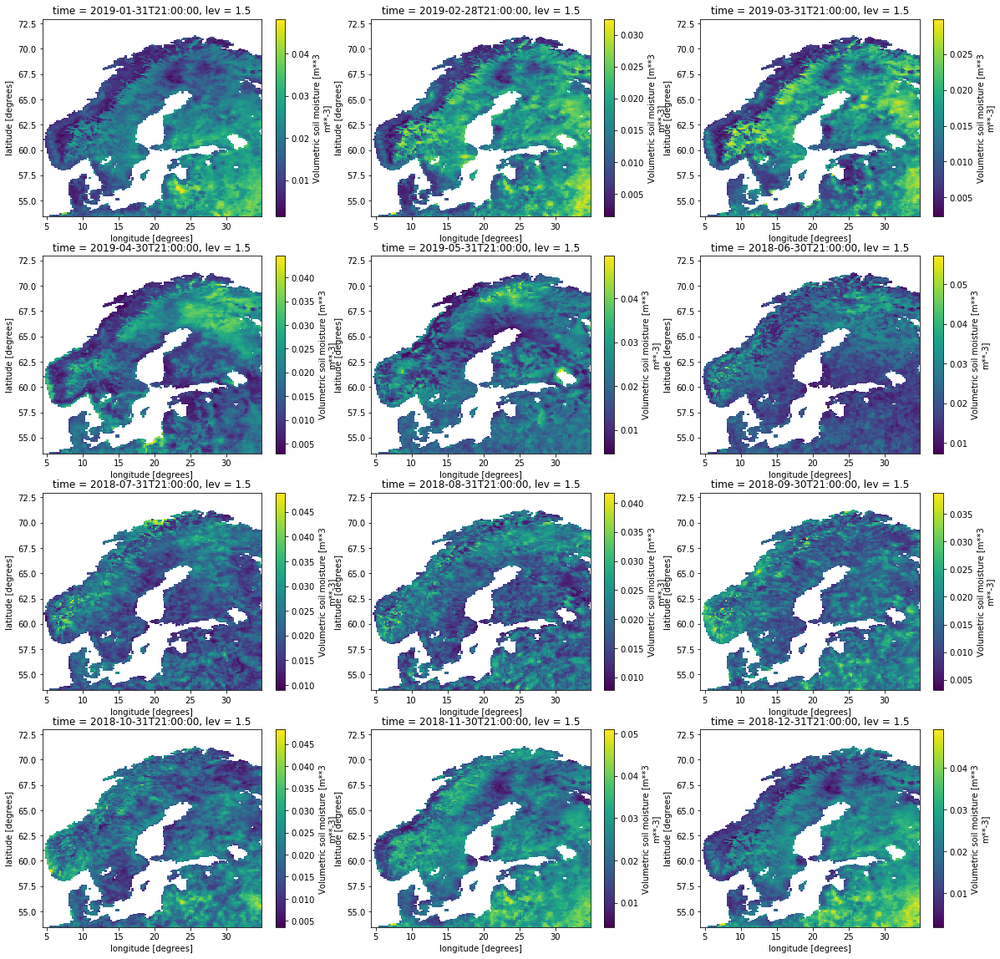

In [29]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20,20))
for i in tqdm(range(0, 4)):
    for j in range(0, 3):
        year = ((i * 3) + j)
        dsstd_2.uerra_harmonie_nordics_sm_L2_ymonstd.isel(time=year,lev=0).plot.pcolormesh(ax=axes[i,j])

# Level 3 (Deep soil) _ SM

In [30]:
!ls -la /data-uerra-sm/UERRA-HARMONIE/level_3

total 4510412
drwxrwxrwx 2 root root         0 Oct 14 07:16 .
drwxrwxrwx 2 root root         0 Oct 14 06:04 ..
-rwxrwxrwx 1 root root 852711540 Oct 14 07:29 uerra_harmonie_soil_moisture_L3_2014.grib
-rwxrwxrwx 1 root root 852711540 Oct 14 07:30 uerra_harmonie_soil_moisture_L3_2015.grib
-rwxrwxrwx 1 root root 855047736 Oct 14 07:31 uerra_harmonie_soil_moisture_L3_2016.grib
-rwxrwxrwx 1 root root 852711540 Oct 14 07:31 uerra_harmonie_soil_moisture_L3_2017.grib
-rwxrwxrwx 1 root root 852711540 Oct 14 07:32 uerra_harmonie_soil_moisture_L3_2018.grib
-rwxrwxrwx 1 root root 352765596 Oct 14 07:33 uerra_harmonie_soil_moisture_L3_2019.grib


## Multi-year monthly mean (Level 3)

In [31]:
!cdo -b 32 -chname,vsw,uerra_harmonie_nordics_sm_L3_ymonmean -ymonmean -cat '/home/behzad/sm-result/uerra_harmonie_soil_moisture_L3_clipped_????.nc' /home/behzad/sm-result/uerra_harmonie_soil_moisture_L3_ymonmean.nc

cdo chname: Started child process "ymonmean -cat /home/behzad/sm-result/uerra_harmonie_soil_moisture_L3_clipped_????.nc (pipe1.1)".
cdo(2) ymonmean: Started child process "cat /home/behzad/sm-result/uerra_harmonie_soil_moisture_L3_clipped_????.nc (pipe2.1)".
cdo(3) cat:                        1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 5 5 5 5 5 5 5 5 5 5 6 6 6 6 6 6 6 6 6 6 7 7 7 7 7 7 7 7 7 7 8 8 8 8 8 8 8 8 8 8 9 9 9 9 9 9 9 9 9 910cdo(3) cat: Processed 218102640 values from 6 variables over 7908 timesteps [4.30s]
cdo(2) ymonmean: Processed 218102640 values from 1 variable over 7908 timesteps [4.30s]
cdo chname: Processed 330960 values from 1 variable over 12 timesteps [4.30s 51MB]


In [32]:
ds_3 = xr.open_dataset('/home/behzad/sm-result/uerra_harmonie_soil_moisture_L3_ymonmean.nc')

In [33]:
ds_3

<xarray.Dataset>
Dimensions:                                (bnds: 2, lat: 197, lev: 1, lon: 140, time: 12)
Coordinates:
  * time                                   (time) datetime64[ns] 2019-01-31T21:00:00 ... 2018-12-31T21:00:00
  * lon                                    (lon) float32 4.5 ... 34.825535
  * lat                                    (lat) float32 53.5 ... 72.91317
  * lev                                    (lev) float64 2.5
Dimensions without coordinates: bnds
Data variables:
    lev_bnds                               (lev, bnds) float64 ...
    uerra_harmonie_nordics_sm_L3_ymonmean  (time, lev, lat, lon) float32 ...
Attributes:
    CDI:          Climate Data Interface version ?? (http://mpimet.mpg.de/cdi)
    Conventions:  CF-1.6
    history:      Wed Oct 23 12:49:32 2019: cdo -b 32 -chname,vsw,uerra_harmo...
    CDO:          Climate Data Operators version 1.9.3 (http://mpimet.mpg.de/...

100%|██████████| 4/4 [00:00<00:00, 12.85it/s]


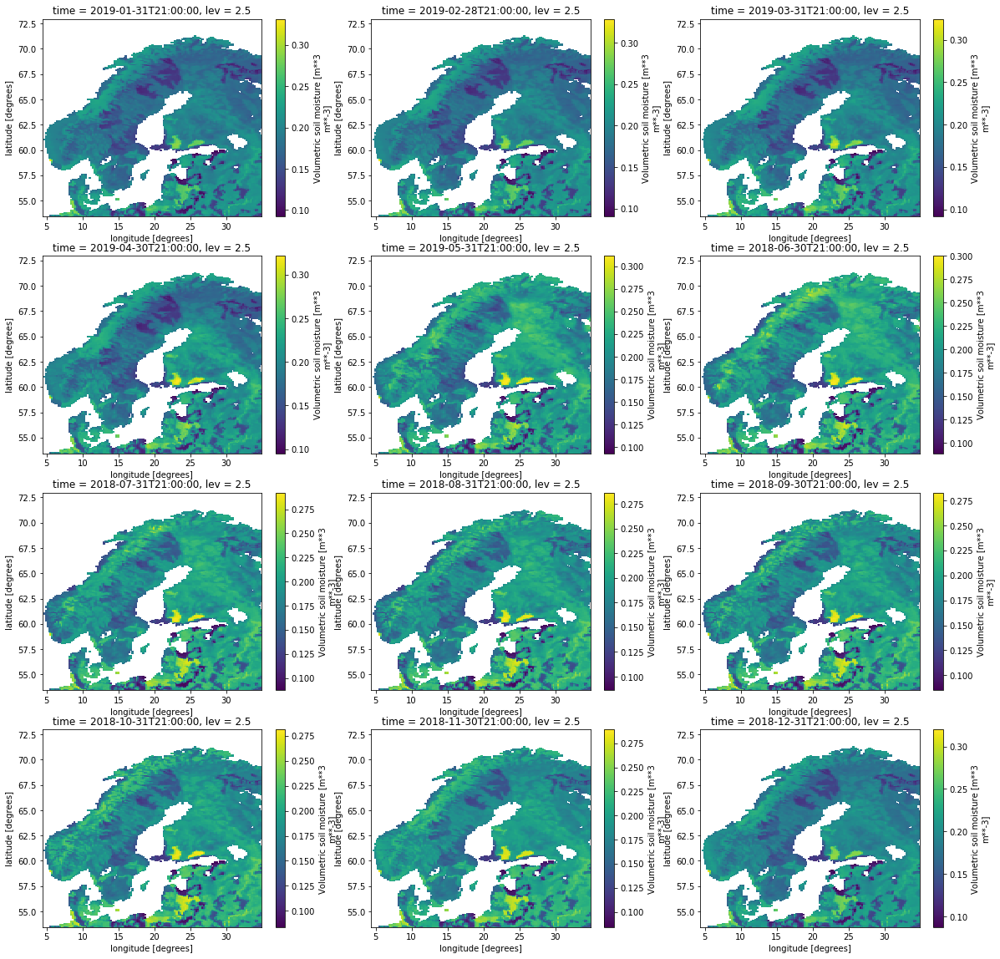

In [34]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20,20))
for i in tqdm(range(0, 4)):
    for j in range(0, 3):
        year = ((i * 3) + j)
        ds_3.uerra_harmonie_nordics_sm_L3_ymonmean.isel(time=year,lev=0).plot.pcolormesh(ax=axes[i,j])

## Multi-year monthly max (Level 3)

In [35]:
!cdo -b 32 -chname,vsw,uerra_harmonie_nordics_sm_L3_ymonmax -ymonmax -cat '/home/behzad/sm-result/uerra_harmonie_soil_moisture_L3_clipped_????.nc' /home/behzad/sm-result/uerra_harmonie_soil_moisture_L3_ymonmax.nc

cdo chname: Started child process "ymonmax -cat /home/behzad/sm-result/uerra_harmonie_soil_moisture_L3_clipped_????.nc (pipe1.1)".
cdo(2) ymonmax: Started child process "cat /home/behzad/sm-result/uerra_harmonie_soil_moisture_L3_clipped_????.nc (pipe2.1)".
cdo(3) cat:                        1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 5 5 5 5 5 5 5 5 5 5 6 6 6 6 6 6 6 6 6 6 7 7 7 7 7 7 7 7 7 7 8 8 8 8 8 8 8 8 8 8 9 9 9 9 9 9 9 9 9 910cdo(3) cat: Processed 218102640 values from 6 variables over 7908 timesteps [3.68s]
cdo(2) ymonmax: Processed 218102640 values from 1 variable over 7908 timesteps [3.68s]
cdo chname: Processed 330960 values from 1 variable over 12 timesteps [3.68s 53MB]


In [36]:
dsmax_3 = xr.open_dataset('/home/behzad/sm-result/uerra_harmonie_soil_moisture_L3_ymonmax.nc')

100%|██████████| 4/4 [00:00<00:00, 12.67it/s]


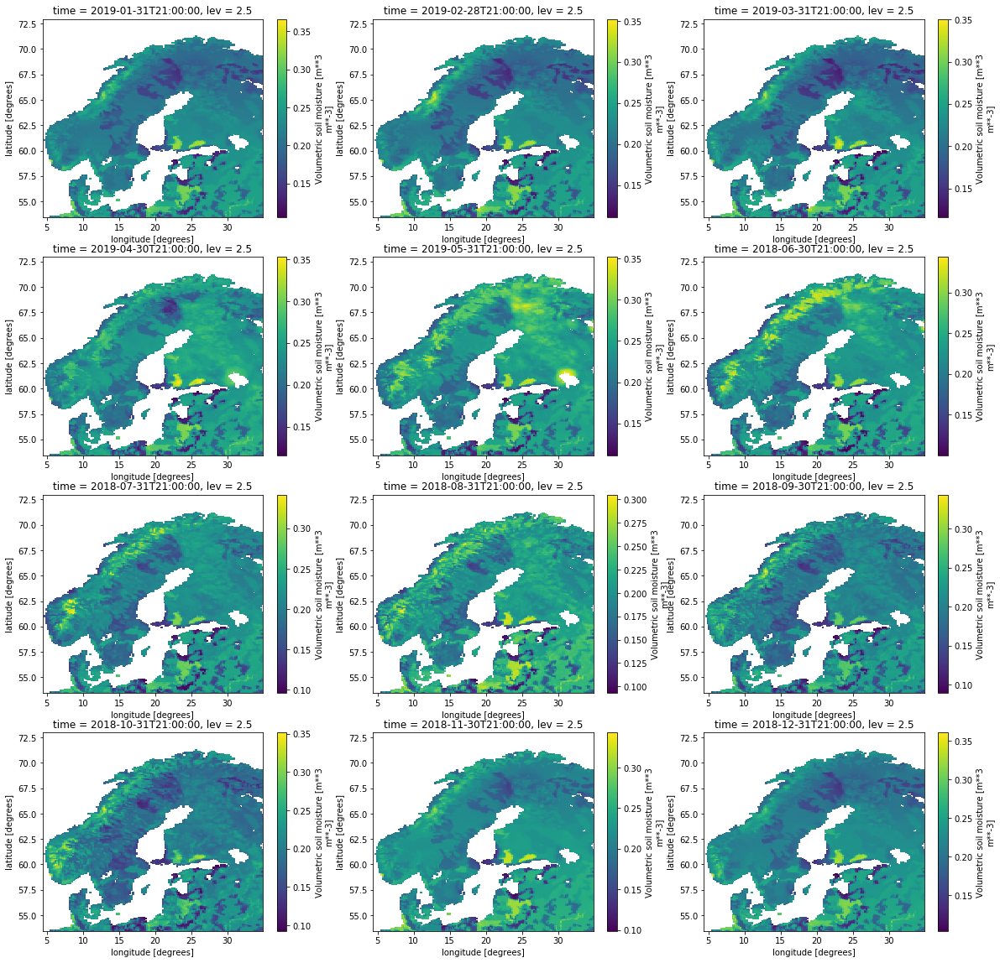

In [37]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20,20))
for i in tqdm(range(0, 4)):
    for j in range(0, 3):
        year = ((i * 3) + j)
        dsmax_3.uerra_harmonie_nordics_sm_L3_ymonmax.isel(time=year,lev=0).plot.pcolormesh(ax=axes[i,j])

## Multi-year monthly min (Level 3)

In [38]:
!cdo -b 32 -chname,vsw,uerra_harmonie_nordics_sm_L3_ymonmin -ymonmin -cat '/home/behzad/sm-result/uerra_harmonie_soil_moisture_L3_clipped_????.nc' /home/behzad/sm-result/uerra_harmonie_soil_moisture_L3_ymonmin.nc

cdo chname: Started child process "ymonmin -cat /home/behzad/sm-result/uerra_harmonie_soil_moisture_L3_clipped_????.nc (pipe1.1)".
cdo(2) ymonmin: Started child process "cat /home/behzad/sm-result/uerra_harmonie_soil_moisture_L3_clipped_????.nc (pipe2.1)".
cdo(3) cat:                        1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 5 5 5 5 5 5 5 5 5 5 6 6 6 6 6 6 6 6 6 6 7 7 7 7 7 7 7 7 7 7 8 8 8 8 8 8 8 8 8 8 9 9 9 9 9 9 9 9 9 910cdo(3) cat: Processed 218102640 values from 6 variables over 7908 timesteps [3.73s]
cdo(2) ymonmin: Processed 218102640 values from 1 variable over 7908 timesteps [3.73s]
cdo chname: Processed 330960 values from 1 variable over 12 timesteps [3.73s 51MB]


In [39]:
dsmin_3 = xr.open_dataset('/home/behzad/sm-result/uerra_harmonie_soil_moisture_L3_ymonmin.nc')

100%|██████████| 4/4 [00:00<00:00,  9.66it/s]


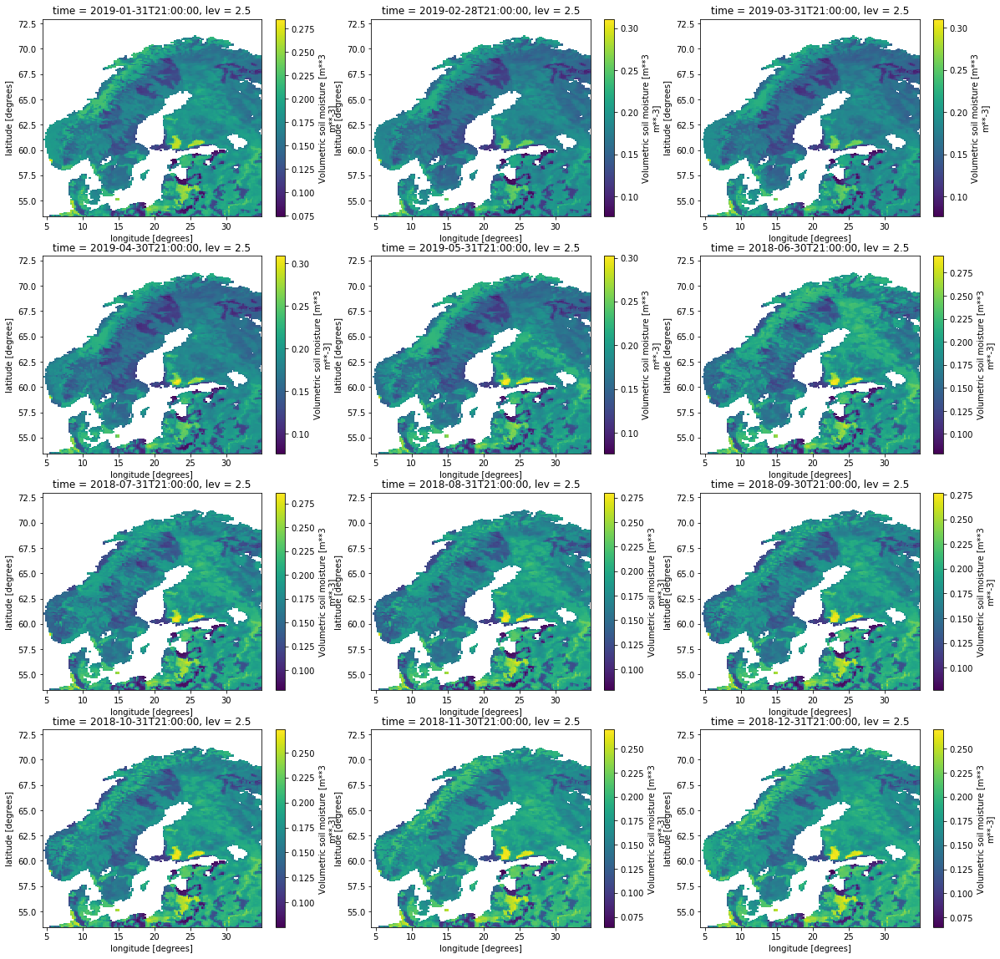

In [40]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20,20))
for i in tqdm(range(0, 4)):
    for j in range(0, 3):
        year = ((i * 3) + j)
        dsmin_3.uerra_harmonie_nordics_sm_L3_ymonmin.isel(time=year,lev=0).plot.pcolormesh(ax=axes[i,j])

## Multi-year monthly std (Level 3)

In [41]:
!cdo -b 32 -chname,vsw,uerra_harmonie_nordics_sm_L3_ymonstd -ymonstd -cat '/home/behzad/sm-result/uerra_harmonie_soil_moisture_L3_clipped_????.nc' /home/behzad/sm-result/uerra_harmonie_soil_moisture_L3_ymonstd.nc

cdo chname: Started child process "ymonstd -cat /home/behzad/sm-result/uerra_harmonie_soil_moisture_L3_clipped_????.nc (pipe1.1)".
cdo(2) ymonstd: Started child process "cat /home/behzad/sm-result/uerra_harmonie_soil_moisture_L3_clipped_????.nc (pipe2.1)".
cdo(3) cat:                        1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 5 5 5 5 5 5 5 5 5 5 6 6 6 6 6 6 6 6 6 6 7 7 7 7 7 7 7 7 7 7 8 8 8 8 8 8 8 8 8 8 9 9 9 9 9 9 9 9 9 910cdo(3) cat: Processed 218102640 values from 6 variables over 7908 timesteps [4.88s]
cdo(2) ymonstd: Processed 218102640 values from 1 variable over 7908 timesteps [4.88s]
cdo chname: Processed 330960 values from 1 variable over 12 timesteps [4.88s 54MB]


In [42]:
dsstd_3 = xr.open_dataset('/home/behzad/sm-result/uerra_harmonie_soil_moisture_L3_ymonstd.nc')

100%|██████████| 4/4 [00:00<00:00, 13.05it/s]


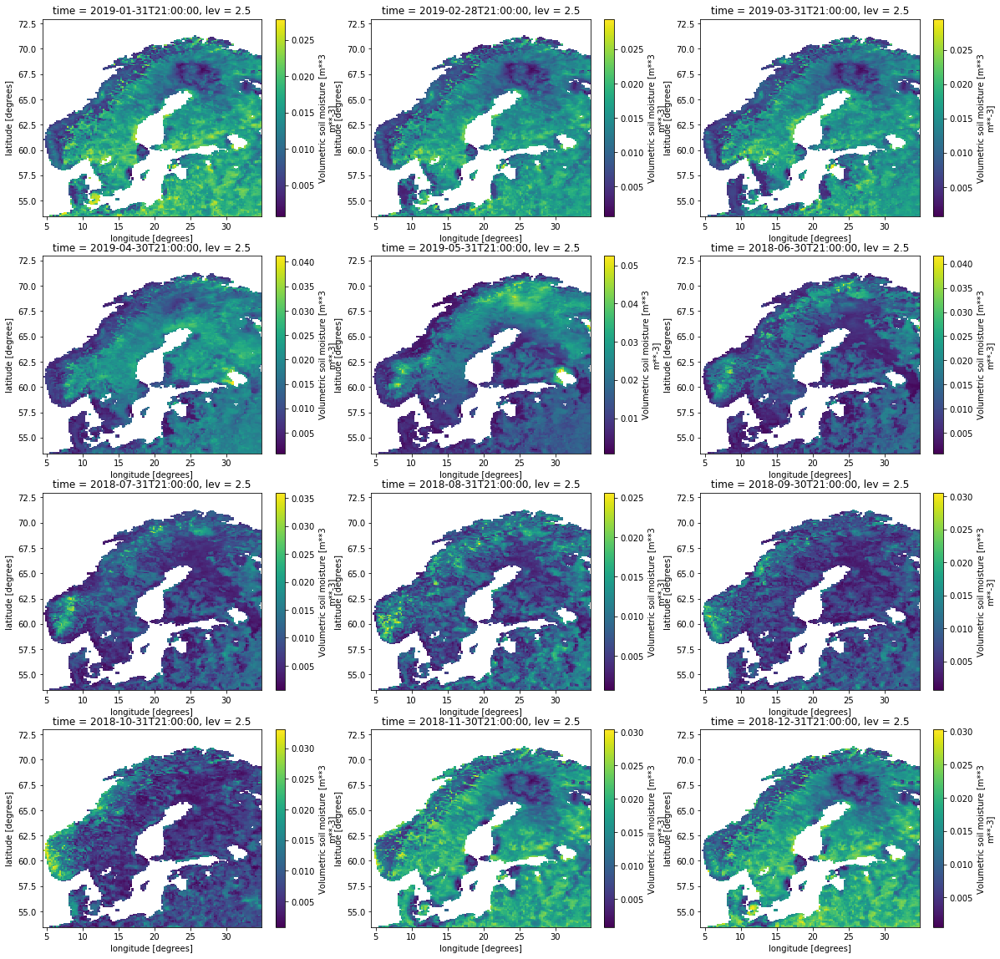

In [43]:
fig, axes = plt.subplots(nrows=4, ncols=3, figsize=(20,20))
for i in tqdm(range(0, 4)):
    for j in range(0, 3):
        year = ((i * 3) + j)
        dsstd_3.uerra_harmonie_nordics_sm_L3_ymonstd.isel(time=year,lev=0).plot.pcolormesh(ax=axes[i,j])